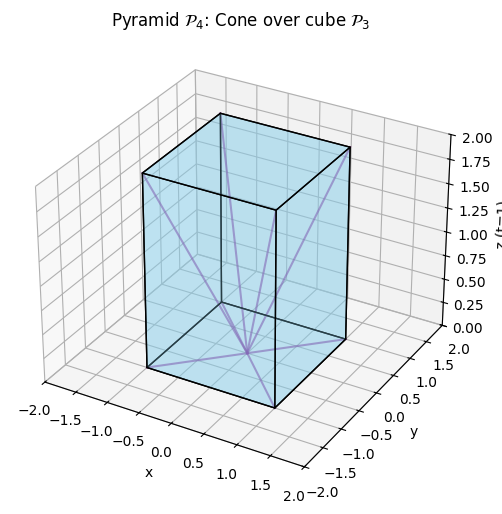

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np

# Create figure and 3D axis
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Define cube vertices in R^3 and shift to z=1
r = [-1, 1]
vertices = np.array([[x, y, z] for x in r for y in r for z in r])
vertices[:, 2] += 1  # Move cube up to z = 1

# Define cube faces
faces = [
    [0,1,3,2], [4,5,7,6],
    [0,1,5,4], [2,3,7,6],
    [1,3,7,5], [0,2,6,4]
]

# Plot cube
ax.add_collection3d(Poly3DCollection([vertices[face] for face in faces], 
                                     facecolors='skyblue', linewidths=1, edgecolors='black', alpha=0.3))

# Add cone edges from origin to each vertex
origin = np.array([0, 0, 0])
for v in vertices:
    ax.plot([origin[0], v[0]], [origin[1], v[1]], [origin[2], v[2]], color='purple', alpha=0.6)

# Labels and limits
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z (t=1)")
ax.set_xlim([-2, 2])
ax.set_ylim([-2, 2])
ax.set_zlim([0, 2])
ax.set_title("Pyramid $\\mathcal{P}_4$: Cone over cube $\\mathcal{P}_3$")

plt.show()


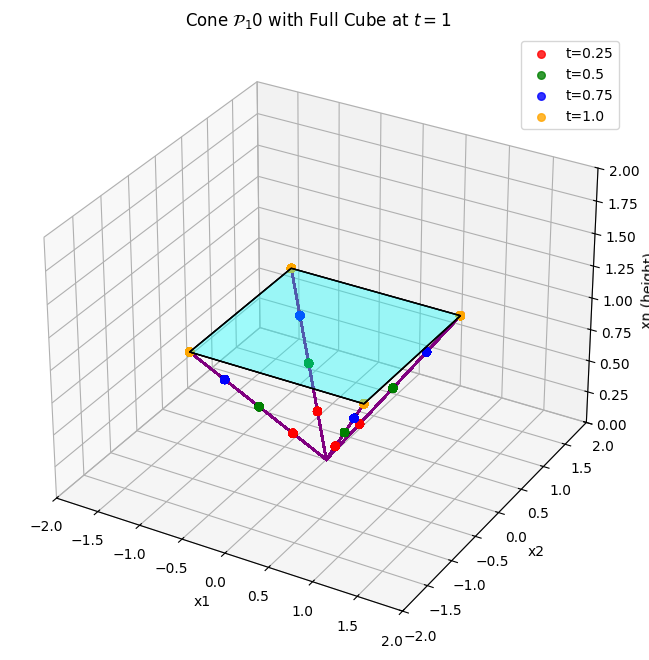

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Parameters
n = 10  # Dimension (e.g., 5 for P5 in R5)
t_values = [0.25, 0.5, 0.75, 1.0]
colors = ['red', 'green', 'blue', 'orange']

# Generate all vertices of the (n-1)-cube
r = [-1, 1]
cube_vertices = np.array(np.meshgrid(*([r] * (n-1)))).T.reshape(-1, n-1)

# Create figure
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# For each t, create scaled version and plot points
for idx, t in enumerate(t_values):
    color = colors[idx % len(colors)]
    
    # Scale (x1, ..., x_{n-1})
    scaled_vertices = t * cube_vertices
    # Add t as the last coordinate
    final_vertices = np.hstack((scaled_vertices, t * np.ones((scaled_vertices.shape[0], 1))))
    
    # Plot projected points with different color
    ax.scatter(final_vertices[:, 0], final_vertices[:, 1], final_vertices[:, -1], 
               label=f't={t}', color=color, s=30, alpha=0.8)

    # Connect vertices to origin
    origin = np.zeros(n)
    for v in final_vertices:
        ax.plot([origin[0], v[0]], [origin[1], v[1]], [origin[-1], v[-1]], color='purple', alpha=0.3)

# ----- Plot the FULL cube at t=1 -----
# Select only first three coordinates for visualization
cube_vertices_3d = cube_vertices[:, :2]  # x1, x2
z = np.ones(len(cube_vertices))          # height (t=1)

cube_vertices_for_plot = np.c_[cube_vertices_3d, z]

# Define faces of cube (in 3D) by connecting vertices
faces = [
    [0,1,3,2], [4,5,7,6],
    [0,1,5,4], [2,3,7,6],
    [0,2,6,4], [1,3,7,5]
]

ax.add_collection3d(Poly3DCollection(
    [cube_vertices_for_plot[face] for face in faces],
    facecolors='cyan', linewidths=1, edgecolors='black', alpha=0.2
))

# ----- Labels -----
ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_zlabel('xn (height)')
ax.set_xlim([-2, 2])
ax.set_ylim([-2, 2])
ax.set_zlim([0, 2])
ax.set_title(f"Cone $\\mathcal{{P}}_{n}$ with Full Cube at $t=1$")
ax.legend()
plt.show()


In [ ]:
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import MDS, Isomap, LocallyLinearEmbedding, SpectralEmbedding, TSNE
import plotly.express as px

# -------------------------------------
# FUNCTION: Sample uniformly from Pyramid P_n
# -------------------------------------
def sample_pyramid_Pn(n, num_samples=500):
    points = []
    while len(points) < num_samples:
        x = np.random.uniform(-1, 1, size=(n-1,))
        if np.max(np.abs(x)) > 1:
            continue
        t = np.random.uniform(0, 1)
        pt = np.append(t * x, t)
        points.append(pt)
    return np.array(points)

# -------------------------------------
# DR Methods generator
# -------------------------------------
def get_methods(n):
    return {
        "PCA": PCA(n_components=n),
        # "MDS": MDS(n_components=n, random_state=42),  
        "Isomap": Isomap(n_components=n, n_neighbors=10),
        "LLE": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='standard'),
        "Hessian LLE": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='hessian'),
        "Modified LLE": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='modified'),
        "Spectral Embedding": SpectralEmbedding(n_components=n, n_neighbors=10),
        # "t-SNE": TSNE(n_components=n, perplexity=30, random_state=42),
        "LTSA": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='ltsa')
    }

# -------------------------------------
# MAIN: Loop over 3D → 10D Pyramid datasets
# -------------------------------------
results = {}
times = []

for n_components in range(3, 11):
    print(f"\n🔢 Generating Pyramid P_{n_components} data (3000 points)")
    X = sample_pyramid_Pn(n_components, num_samples=3000)
    t_values = X[:, -1]  # Last coordinate is t
    methods = get_methods(n_components)

    for name, model in methods.items():
        print(f"→ Running {name} ({n_components}D)", end=" ... ")
        try:
            start = time.time()
            X_trans = model.fit_transform(X)
            duration = time.time() - start
            results[(name, n_components)] = X_trans
            times.append((name, n_components, duration))
            print(f"✅ {duration:.3f}s")

            # Plotting
            if X_trans.shape[1] >= 3:
                fig = px.scatter_3d(
                    x=X_trans[:, 0],
                    y=X_trans[:, 1],
                    z=X_trans[:, 2],
                    color=t_values,
                    color_continuous_scale='Viridis',
                    title=f"{name} ({n_components}D Pyramid) - First 3 Components (colored by t)",
                    opacity=0.7
                )
                fig.show()
            else:
                plt.figure(figsize=(7, 6))
                sc = plt.scatter(X_trans[:, 0], X_trans[:, 1], c=t_values, cmap='viridis', alpha=0.7)
                plt.colorbar(sc, label='Height t')
                plt.title(f"{name} ({n_components}D Pyramid) - First 2 Components (colored by t)")
                plt.xlabel("Component 1")
                plt.ylabel("Component 2")
                plt.grid(True)
                plt.tight_layout()
                plt.show()

        except Exception as e:
            print(f"❌ Failed: {e}")
            times.append((name, n_components, None))

# -------------------------------------
# Build Summary Table (optional)
# -------------------------------------
time_df = pd.DataFrame(times, columns=["Method", "n_components", "Time (s)"])
pivot_df = time_df.pivot(index="Method", columns="n_components", values="Time (s)").round(4)

print("\n⏱️ Execution Time Table:")
print(pivot_df)



🔢 Generating Pyramid P_3 data (3000 points)
→ Running PCA (3D) ... ✅ 0.002s


→ Running Isomap (3D) ... ✅ 5.774s


→ Running LLE (3D) ... ✅ 0.526s


→ Running Hessian LLE (3D) ... ✅ 3.378s


→ Running Modified LLE (3D) ... ✅ 6.520s


→ Running Spectral Embedding (3D) ... ✅ 0.623s


→ Running LTSA (3D) ... ✅ 5.223s



🔢 Generating Pyramid P_4 data (3000 points)
→ Running PCA (4D) ... ✅ 0.002s


→ Running Isomap (4D) ... ✅ 5.697s


→ Running LLE (4D) ... ✅ 1.085s


→ Running Hessian LLE (4D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (4D) ... ✅ 7.538s


→ Running Spectral Embedding (4D) ... ✅ 0.680s


→ Running LTSA (4D) ... ✅ 5.668s



🔢 Generating Pyramid P_5 data (3000 points)
→ Running PCA (5D) ... ✅ 0.002s


→ Running Isomap (5D) ... ✅ 6.453s


→ Running LLE (5D) ... ✅ 1.643s


→ Running Hessian LLE (5D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (5D) ... ✅ 7.608s


→ Running Spectral Embedding (5D) ... ✅ 1.294s


→ Running LTSA (5D) ... ✅ 7.130s



🔢 Generating Pyramid P_6 data (3000 points)
→ Running PCA (6D) ... ✅ 0.002s


→ Running Isomap (6D) ... ✅ 6.511s


→ Running LLE (6D) ... ✅ 2.411s


→ Running Hessian LLE (6D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (6D) ... ✅ 9.064s


→ Running Spectral Embedding (6D) ... ✅ 1.690s


→ Running LTSA (6D) ... ❌ Failed: Error in determining null-space with ARPACK. Error message: 'Factor is exactly singular'. Note that eigen_solver='arpack' can fail when the weight matrix is singular or otherwise ill-behaved. In that case, eigen_solver='dense' is recommended. See online documentation for more information.

🔢 Generating Pyramid P_7 data (3000 points)
→ Running PCA (7D) ... ✅ 0.002s


→ Running Isomap (7D) ... ✅ 6.586s


→ Running LLE (7D) ... ✅ 3.176s


→ Running Hessian LLE (7D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (7D) ... ✅ 9.281s


→ Running Spectral Embedding (7D) ... ✅ 2.594s


→ Running LTSA (7D) ... 

In [2]:
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding, SpectralEmbedding
import plotly.express as px

# -------------------------------------
# FUNCTION: Sample uniformly from Pyramid P_n
# -------------------------------------
def sample_pyramid_Pn(n, num_samples=500):
    """
    Returns list of tuples (scaled_point, unscaled_base_point)
    """
    points = []
    while len(points) < num_samples:
        x = np.random.uniform(-1, 1, size=(n-1,))
        if np.max(np.abs(x)) > 1:
            continue
        t = np.random.uniform(0, 1)
        x_scaled = t * x
        pt = np.append(x_scaled, t)
        points.append((pt, x))  # Return both scaled point and unscaled x
    return points

# -------------------------------------
# FUNCTION: Label points by which cube face they lie on
# -------------------------------------
def label_cube_face(X, tol=0.05):
    """
    Label points by which face of the cube base they are closest to.
    Each face is defined by a coordinate being near ±1.
    Returns integer labels, or -99 if no face found within tol.
    """
    base_coords = X[:, :-1]  # exclude last coordinate (fake t=1 here)
    abs_diff = np.abs(np.abs(base_coords) - 1)  # distance to ±1
    min_diff = np.min(abs_diff, axis=1)
    
    coord_index = np.argmin(abs_diff, axis=1)
    signs = np.sign(base_coords[np.arange(len(X)), coord_index]).astype(int)
    
    labels = np.where(min_diff <= tol, coord_index * 2 + (signs < 0), -99)
    return labels

# -------------------------------------
# DR Methods generator
# -------------------------------------
def get_methods(n):
    return {
        "PCA": PCA(n_components=n),
        "Isomap": Isomap(n_components=n, n_neighbors=10),
        "LLE": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='standard'),
        "Hessian LLE": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='hessian'),
        "Modified LLE": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='modified'),
        "Spectral Embedding": SpectralEmbedding(n_components=n, n_neighbors=10),
        "LTSA": LocallyLinearEmbedding(n_components=n, n_neighbors=10, method='ltsa')
    }

# -------------------------------------
# MAIN: Loop over 3D → 10D Pyramid datasets
# -------------------------------------
results = {}
times = []

for n_components in range(3, 11):
    print(f"\n🔢 Generating Pyramid P_{n_components} data (3000 points)")
    raw = sample_pyramid_Pn(n_components, num_samples=3000)
    
    # Extract arrays
    X = np.array([pt for pt, _ in raw])                  # scaled points
    X_base = np.array([x for _, x in raw])               # unscaled base cube
    X_base_with_t = np.column_stack((X_base, np.ones(len(X_base))))  # fake t=1 for compatibility
    
    face_labels = label_cube_face(X_base_with_t)

    # Filter out points with no assigned face
    mask = face_labels != -99
    X = X[mask]
    face_labels = face_labels[mask]

    methods = get_methods(n_components)

    for name, model in methods.items():
        print(f"→ Running {name} ({n_components}D)", end=" ... ")
        try:
            start = time.time()
            X_trans = model.fit_transform(X)
            duration = time.time() - start
            results[(name, n_components)] = X_trans
            times.append((name, n_components, duration))
            print(f"✅ {duration:.3f}s")

            # Plotting
            if X_trans.shape[1] >= 3:
                fig = px.scatter_3d(
                    x=X_trans[:, 0],
                    y=X_trans[:, 1],
                    z=X_trans[:, 2],
                    color=face_labels.astype(str),
                    title=f"{name} ({n_components}D Pyramid) - First 3 Components (colored by face label)",
                    opacity=0.7
                )
                fig.show()
            else:
                plt.figure(figsize=(7, 6))
                scatter = plt.scatter(
                    X_trans[:, 0], X_trans[:, 1],
                    c=face_labels, cmap='tab20', alpha=0.7
                )
                plt.colorbar(scatter, label='Face label')
                plt.title(f"{name} ({n_components}D Pyramid) - First 2 Components (colored by face label)")
                plt.xlabel("Component 1")
                plt.ylabel("Component 2")
                plt.grid(True)
                plt.tight_layout()
                plt.show()

        except Exception as e:
            print(f"❌ Failed: {e}")
            times.append((name, n_components, None))

# -------------------------------------
# Build Summary Table (optional)
# -------------------------------------
time_df = pd.DataFrame(times, columns=["Method", "n_components", "Time (s)"])
pivot_df = time_df.pivot(index="Method", columns="n_components", values="Time (s)").round(4)

print("\n⏱️ Execution Time Table:")
print(pivot_df)



🔢 Generating Pyramid P_3 data (3000 points)
→ Running PCA (3D) ... ✅ 0.002s


→ Running Isomap (3D) ... ✅ 0.050s


→ Running LLE (3D) ... ✅ 0.034s


→ Running Hessian LLE (3D) ... ✅ 0.743s


→ Running Modified LLE (3D) ... ✅ 0.981s


→ Running Spectral Embedding (3D) ... ✅ 0.013s


→ Running LTSA (3D) ... ✅ 0.921s



🔢 Generating Pyramid P_4 data (3000 points)
→ Running PCA (4D) ... ✅ 0.001s


→ Running Isomap (4D) ... ✅ 0.175s


→ Running LLE (4D) ... ✅ 0.070s


→ Running Hessian LLE (4D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (4D) ... ✅ 2.408s


→ Running Spectral Embedding (4D) ... ✅ 0.045s


→ Running LTSA (4D) ... ✅ 1.313s



🔢 Generating Pyramid P_5 data (3000 points)
→ Running PCA (5D) ... ✅ 0.001s


→ Running Isomap (5D) ... ✅ 0.209s


→ Running LLE (5D) ... ✅ 0.123s


→ Running Hessian LLE (5D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (5D) ... ✅ 2.144s


→ Running Spectral Embedding (5D) ... ✅ 0.047s


→ Running LTSA (5D) ... ❌ Failed: Error in determining null-space with ARPACK. Error message: 'Factor is exactly singular'. Note that eigen_solver='arpack' can fail when the weight matrix is singular or otherwise ill-behaved. In that case, eigen_solver='dense' is recommended. See online documentation for more information.

🔢 Generating Pyramid P_6 data (3000 points)
→ Running PCA (6D) ... ✅ 0.001s


→ Running Isomap (6D) ... ✅ 0.240s


→ Running LLE (6D) ... ✅ 0.099s


→ Running Hessian LLE (6D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (6D) ... ✅ 1.608s


→ Running Spectral Embedding (6D) ... ✅ 0.072s


→ Running LTSA (6D) ... ❌ Failed: Error in determining null-space with ARPACK. Error message: 'Factor is exactly singular'. Note that eigen_solver='arpack' can fail when the weight matrix is singular or otherwise ill-behaved. In that case, eigen_solver='dense' is recommended. See online documentation for more information.

🔢 Generating Pyramid P_7 data (3000 points)
→ Running PCA (7D) ... ✅ 0.002s


→ Running Isomap (7D) ... ✅ 0.436s


→ Running LLE (7D) ... ✅ 0.202s


→ Running Hessian LLE (7D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (7D) ... ✅ 2.315s


→ Running Spectral Embedding (7D) ... ✅ 0.145s


→ Running LTSA (7D) ... ❌ Failed: Error in determining null-space with ARPACK. Error message: 'Factor is exactly singular'. Note that eigen_solver='arpack' can fail when the weight matrix is singular or otherwise ill-behaved. In that case, eigen_solver='dense' is recommended. See online documentation for more information.

🔢 Generating Pyramid P_8 data (3000 points)
→ Running PCA (8D) ... ✅ 0.001s


→ Running Isomap (8D) ... ✅ 0.785s


→ Running LLE (8D) ... ✅ 0.323s


→ Running Hessian LLE (8D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (8D) ... ✅ 2.711s


→ Running Spectral Embedding (8D) ... ✅ 0.140s


→ Running LTSA (8D) ... ❌ Failed: Error in determining null-space with ARPACK. Error message: 'Factor is exactly singular'. Note that eigen_solver='arpack' can fail when the weight matrix is singular or otherwise ill-behaved. In that case, eigen_solver='dense' is recommended. See online documentation for more information.

🔢 Generating Pyramid P_9 data (3000 points)
→ Running PCA (9D) ... ✅ 0.001s


→ Running Isomap (9D) ... ✅ 0.814s


→ Running LLE (9D) ... ✅ 0.492s


→ Running Hessian LLE (9D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (9D) ... ✅ 2.807s


→ Running Spectral Embedding (9D) ... ✅ 0.481s


→ Running LTSA (9D) ... ✅ 2.415s



🔢 Generating Pyramid P_10 data (3000 points)
→ Running PCA (10D) ... ✅ 0.003s


→ Running Isomap (10D) ... ✅ 1.416s


→ Running LLE (10D) ... ✅ 0.859s


→ Running Hessian LLE (10D) ... ❌ Failed: for method='hessian', n_neighbors must be greater than [n_components * (n_components + 3) / 2]
→ Running Modified LLE (10D) ... 

c:\Users\CYTech Student\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\manifold\_locally_linear.py:369: RuntimeWarning:

invalid value encountered in scalar divide



✅ 2.973s


→ Running Spectral Embedding (10D) ... ✅ 0.727s


→ Running LTSA (10D) ... ✅ 2.717s



⏱️ Execution Time Table:
n_components            3       4       5       6       7       8       9   \
Method                                                                       
Hessian LLE         0.7432     NaN     NaN     NaN     NaN     NaN     NaN   
Isomap              0.0499  0.1753  0.2094  0.2398  0.4358  0.7851  0.8137   
LLE                 0.0336  0.0702  0.1230  0.0985  0.2021  0.3226  0.4917   
LTSA                0.9206  1.3128     NaN     NaN     NaN     NaN  2.4149   
Modified LLE        0.9815  2.4081  2.1442  1.6081  2.3145  2.7110  2.8068   
PCA                 0.0018  0.0007  0.0015  0.0014  0.0017  0.0015  0.0010   
Spectral Embedding  0.0132  0.0453  0.0473  0.0725  0.1449  0.1403  0.4810   

n_components            10  
Method                      
Hessian LLE            NaN  
Isomap              1.4161  
LLE                 0.8585  
LTSA                2.7173  
Modified LLE        2.9726  
PCA                 0.0029  
Spectral Embedding  0.7269  
